## Show Example First Level Model

This notebook gives an example of a first level model of the task switching data

In [1]:
%matplotlib inline
import os

import pickle
import os
from nistats.first_level_model import FirstLevelModel
from nistats.second_level_model import SecondLevelModel
from nistats import design_matrix as dm
from nistats.reporting import plot_design_matrix
from nistats.thresholding import map_threshold
from bids.layout import BIDSLayout
from nilearn import plotting
import matplotlib.pyplot as plt
import pandas as pd
import nibabel as nib
import numpy as np

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__

## Setup definitions and variables

In [2]:
# useful function from nibetaseries 
# https://github.com/HBClab/NiBetaSeries/blob/04a679c164de1316efbac67a289a9ea33d46f64f/src/nibetaseries/interfaces/nistats.py#L278
def _select_confounds(confounds_file, selected_confounds):
    """Process and return selected confounds from the confounds file
    Parameters
    ----------
    confounds_file : str
        File that contains all usable confounds
    selected_confounds : list
        List containing all desired confounds.
        confounds can be listed as regular expressions (e.g., "motion_outlier.*")
    Returns
    -------
    desired_confounds : DataFrame
        contains all desired (processed) confounds.
    """
    import pandas as pd
    import numpy as np
    import re

    confounds_df = pd.read_csv(confounds_file, sep='\t', na_values='n/a')
    # regular expression to capture confounds specified at the command line
    confound_expr = re.compile(r"|".join(selected_confounds))
    expanded_confounds = list(filter(confound_expr.fullmatch, confounds_df.columns))
    imputables = ('framewise_displacement', 'std_dvars', 'dvars', '.*derivative1.*')

    # regular expression to capture all imputable confounds
    impute_expr = re.compile(r"|".join(imputables))
    expanded_imputables = list(filter(impute_expr.fullmatch, expanded_confounds))
    for imputable in expanded_imputables:
        vals = confounds_df[imputable].values
        if not np.isnan(vals[0]):
            continue
        # Impute the mean non-zero, non-NaN value
        confounds_df[imputable][0] = np.nanmean(vals[vals != 0])

    desired_confounds = confounds_df[expanded_confounds]
    # check to see if there are any remaining nans
    if desired_confounds.isna().values.any():
        msg = "The selected confounds contain nans: {conf}".format(conf=expanded_confounds)
        raise ValueError(msg)
    return desired_confounds

In [21]:
# Hardcoded PATHS
BIDS_PATH = '../..'
FMRIPREP_PATH = '../fmriprep'
# DATABASE_PATH = '/home/jdkent/first_level.sqlite'
# DATABASE_PATH = '/home/jdkent/'
FIRST_LEVEL_RESULTS = './outputs/first_level_res.pkl'
SECOND_LEVEL_RESULTS = './outputs/second_level_res.pkl'
# path to bold QA measures
BOLD_QA = '../mriqc/group_bold.tsv'

# OUTPUTS
ATLAS_PATH = '../data/overall_response_atlas.nii.gz'
ATLAS_LUT = '../data/overall_response.tsv'

In [4]:
# layout to get the necessary data files
layout = BIDSLayout(BIDS_PATH,
                    derivatives=FMRIPREP_PATH,
                    # database_path=DATABASE_PATH,
                    #reset_database=False
)

## Filter data based on Framewise Displacement

In [11]:
def proc_bold_qa(bold_qa_file):
    bold_qa = pd.read_csv(bold_qa_file, sep='\t')
    # drop the rest rows
    bold_qa = bold_qa[~bold_qa['bids_name'].str.contains('.*rest.*')]
    
    split_columns = bold_qa['bids_name'].str.split('_|-', n = 7, expand = True)
    bold_qa['task'] = split_columns[5]
    bold_qa['participant_id'] = split_columns[1]
    return bold_qa

bold_qa = proc_bold_qa(BOLD_QA)
bold_qa.head()

,bids_name,aor,aqi,dummy_trs,dvars_nstd,dvars_std,dvars_vstd,efc,fber,fd_mean,...,summary_fg_mad,summary_fg_mean,summary_fg_median,summary_fg_n,summary_fg_p05,summary_fg_p95,summary_fg_stdv,tsnr,task,participant_id
0,sub-GE120001_ses-pre_task-fauxbold_bold,0.001063,0.006351,2,16.187316,1.198663,1.010760,0.448331,3009467.75,0.103818,...,232.520432,1381.902222,1410.488159,29195.0,837.753119,1812.366785,297.530945,64.075073,fauxbold,GE120001
3,sub-GE120001_ses-pre_task-taskswitch_bold,0.003942,0.005572,2,15.734272,1.148948,0.957532,0.450887,1364181.25,0.138379,...,216.930939,1391.725708,1421.432861,29084.0,868.629898,1788.999225,284.924835,72.902779,taskswitch,GE120001
4,sub-GE120002_ses-pre_task-fauxbold_bold,0.002056,0.010868,1,17.975215,1.024274,1.143355,0.432753,3026978.75,0.227028,...,225.343140,1283.572998,1322.169800,27338.0,738.498715,1686.504254,287.157501,47.578674,fauxbold,GE120002
7,sub-GE120002_ses-pre_task-taskswitch_bold,0.002134,0.004827,1,16.918552,1.176876,0.990735,0.431836,4213331.00,0.169619,...,229.552505,1292.104004,1334.634033,27340.0,734.595834,1700.930396,292.718201,71.898445,taskswitch,GE120002
8,sub-GE120003_ses-pre_task-fauxbold_bold,0.003094,0.018135,1,38.223070,1.116687,0.909317,0.393451,2381240.50,0.577373,...,246.342178,1247.227295,1309.490601,23125.0,595.968738,1648.415723,314.057434,31.255548,fauxbold,GE120003


In [12]:
bold_qa_select = bold_qa[['participant_id', 'task', 'tsnr', 'fd_mean', 'fd_num']]

In [13]:
# eliminate people with fd_num >= 100 (threshold to keep number of regressors low)
bad_participants = bold_qa_select[bold_qa_select['fd_num'] >= 100]['participant_id'].unique()
bad_participants

array(['GE120003', 'GE120015', 'GE120020', 'GE120021', 'GE120024',
       'GE120026', 'GE120037', 'GE120038', 'GE120039', 'GE120043',
       'GE120045', 'GE120049', 'GE120052', 'GE120054', 'GE120055',
       'GE120059', 'GE120060', 'GE120065', 'GE120068', 'GE120069',
       'GE120075'], dtype=object)

In [14]:
ent = layout.entities['subject']
good_participants = list(set(ent.unique()) - set(bad_participants))
len(good_participants)

40

## Run model on all data

In [16]:
def _merge_masks(masks):
    mask_img = nib.load(masks.pop(0))
    add_mask = mask_img.get_fdata().astype(int)
    for counter, mask in enumerate(masks):
        add_mask += nib.load(mask).get_fdata().astype(int)
    half_masks = counter // 2
    bin_mask = np.where(add_mask > half_masks, 1, 0)
    bin_mask_img = nib.Nifti1Image(bin_mask, mask_img.affine, header=mask_img.header)

    return bin_mask_img

In [17]:
def _fit_first_level(layout, participant, task, confounds, mask, debug_design=False, specific_contrasts=None):
    preproc = layout.get(subject=participant,
                     suffix='bold',
                     extension='nii.gz',
                     desc='preproc',
                     space='MNI152NLin2009cAsym',
                     task=task)[0]
    preproc_file = preproc.path
    tr = preproc.get_metadata()['RepetitionTime']

    confounds_file = layout.get(subject=participant,
                            suffix='regressors',
                            extension='tsv',
                            desc='confounds',
                            task=task,
                            return_type='file')[0]
    
    event_file = layout.get(subject=participant,
                            suffix='events',
                            extension='tsv',
                            task=task,
                            return_type='file')[0]

    
    events_df = pd.read_csv(event_file, sep='\t')
    print("found files")
    confounds_df = _select_confounds(confounds_file, confounds)
    frame_times = np.arange(nib.load(preproc_file).shape[-1]) * tr
    # drift_model is None because I'm assuming user is passing Cosine inputs
    design_matrix = dm.make_first_level_design_matrix(
        frame_times, events_df, drift_model=None, add_regs=confounds_df,
        add_reg_names=confounds_df.columns.to_list())
    
    print("made design matrix")
    # fit the model
    model = FirstLevelModel(t_r=tr,
                            drift_model=None,
                            high_pass=None,
                            smoothing_fwhm=6.0,
                            mask_img=mask)
    
    print("made model")
    model.fit(preproc_file, design_matrices=design_matrix)
    print("fit model")
    trial_types = events_df['trial_type'].unique()
    # generate overall task contrast
    effect_of_interest = np.array([[1 if c == trial_type else 0 for c in design_matrix.columns]
                                   for trial_type in trial_types])

    contrasts = {trial_type: np.array([1 if c == trial_type else 0 for c in design_matrix.columns])
                 for trial_type in trial_types}

    contrasts['overall_resp'] = np.array([[1 if c == trial_type else 0 for c in design_matrix.columns]
                                   for trial_type in trial_types])

    for contrast in specific_contrasts:
        contrasts[contrast] = contrast
    print("made contrasts")
    c_maps = {}
    for name, contrast in contrasts.items():
         c_maps[name] = model.compute_contrast(contrast, output_type='all')
    
    print("computed contrasts")

    if debug_design:
        return c_maps, design_matrix
    else:
        return c_maps

In [18]:
min_confounds = ["white_matter", "csf", "cosine[0-9]{2}", "framewise_displacement", "non_steady_state_outlier[0-9]{2}", "motion_outlier[0-9]{2}"]
task = 'taskswitch'

mask_files = layout.get(suffix='mask',
                        extension='nii.gz',
                        desc='brain',
                        space='MNI152NLin2009cAsym',
                        task=task,
                        subject=good_participants,
                        return_type='file')

mask_img = _merge_masks(mask_files)



In [19]:
plotting.view_img(mask_img, opacity=0.4)

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/image/resampling.py:510: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [20]:
if os.path.isfile(FIRST_LEVEL_RESULTS):
    with open(FIRST_LEVEL_RESULTS, "rb") as pklr:
        first_level_res = pickle.load(pklr)
else:
    first_level_res = {
        part: _fit_first_level(layout, part, task, min_confounds, mask_img, specific_contrasts=['switch - repeat'])
        for part in good_participants
    }
    with open(FIRST_LEVEL_RESULTS, "wb") as pklw:
        pickle.dump(first_level_res, pklw)

found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/first_level_model.py:73: UserWarning: Mean values of 0 observed.The data have probably been centered.Scaling might not work as expected
  warn('Mean values of 0 observed.'


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/first_level_model.py:73: UserWarning: Mean values of 0 observed.The data have probably been centered.Scaling might not work as expected
  warn('Mean values of 0 observed.'


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model
fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model
fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model
fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model
fit model
made contrasts
computed contrasts
found files


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


made design matrix
made model
fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts
found files
made design matrix
made model


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


fit model
made contrasts
computed contrasts


## Second Level Model

In [22]:
# number of participants
len(first_level_res.keys())

40

In [23]:
# model the intercept to get an average
snd_lvl_des_mtx = pd.DataFrame([1] * len(first_level_res.keys()), columns=['intercept'])

In [24]:
# get all contrasts
contrast_types = list(first_level_res['GE120001'].keys())

In [107]:
if os.path.isfile(SECOND_LEVEL_RESULTS):
    with open(SECOND_LEVEL_RESULTS, "rb") as pklr:
        second_level_res = pickle.load(pklr)
else:
    second_level_res = {}
    for contrast in contrast_types:
        c_stats = {}
        cmap_imgs = [c[contrast]['effect_size'] for c in first_level_res.values()]
        snd_model = SecondLevelModel().fit(cmap_imgs, design_matrix=snd_lvl_des_mtx)
        c_stats['no_thresh'] = snd_model.compute_contrast(output_type='z_score')
        c_stats['fdr05_thresh'], _ = map_threshold(c_stats['no_thresh'], alpha=.05, cluster_threshold=10, height_control='fdr')
        c_stats['fdr01_thresh'], _ = map_threshold(c_stats['no_thresh'], alpha=.01, cluster_threshold=10, height_control='fdr')
        second_level_res[contrast] = c_stats

    with open(SECOND_LEVEL_RESULTS, "wb") as pklw:
        pickle.dump(second_level_res, pklw)

In [108]:
for idx, (contrast, c_stats) in enumerate(second_level_res.items()):
    display(plotting.view_img(second_level_res[contrast]['fdr01_thresh'],
                              threshold=3.1, vmax=10, title=contrast))

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


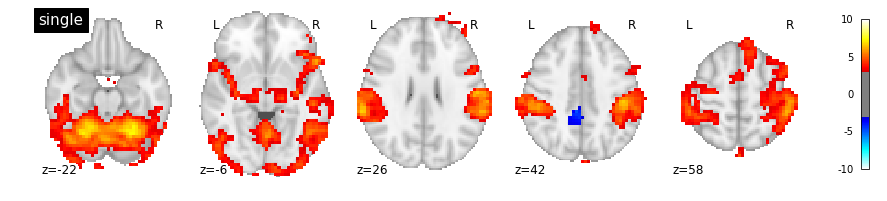

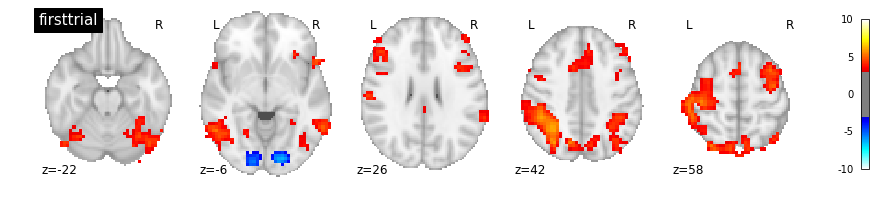

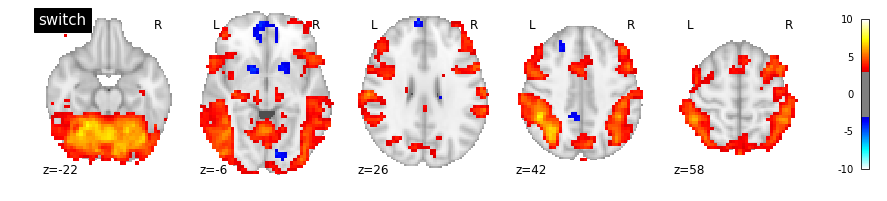

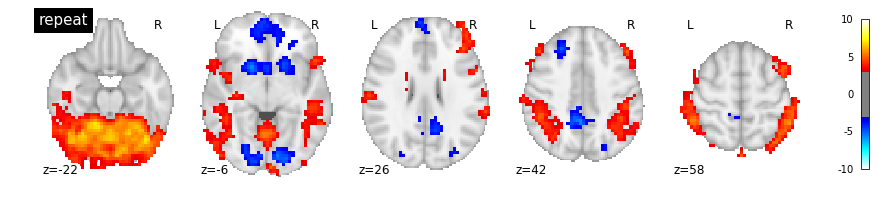

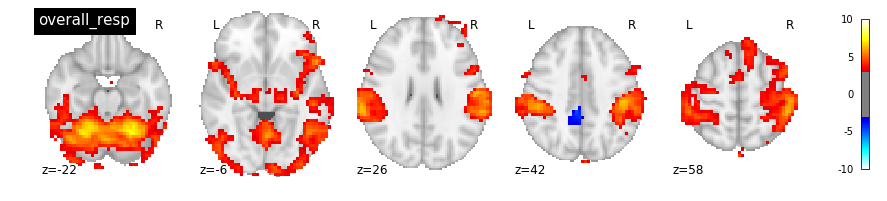

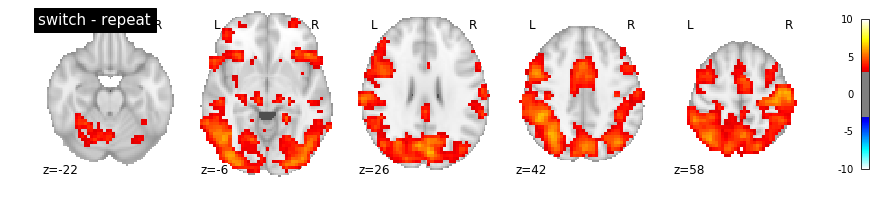

In [140]:
for idx, (contrast, c_stats) in enumerate(second_level_res.items()):
    plotting.plot_stat_map(second_level_res[contrast]['fdr01_thresh'],
                           threshold=3.1, vmax=10, title=contrast, display_mode='z',
                           cut_coords=(-22, -6, 26, 42, 58))
    plt.savefig('./outputs/stat-map-' + contrast + '.png', bbox_inches='tight')

## Extract regions from first level maps

In [110]:
from nilearn.regions import RegionExtractor, connected_regions
from nilearn.image import threshold_img
from nistats.reporting import get_clusters_table

In [145]:
# 14 mm was chosen as the minimum distance to have non-overlapping regions of interest
# a slightly higher threshold (3.3 versus 3.1) breaks up the large clusters into smaller reportable clusters
overall_resp_clusters = get_clusters_table(second_level_res['overall_resp']['no_thresh'],
                   stat_threshold=3.3,
                   cluster_threshold=10,
                   min_distance=14)
overall_resp_clusters.to_csv("./outputs/cluster_table.tsv",
                             sep='\t',
                             index=False,
                             float_format='%.2f',
                             na_rep="sub-cluster")
overall_resp_clusters

,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,24.329999,-59.802001,-22.0,7.405677,290862
1,1a,-16.926001,-56.364001,-18.0,7.285523,
2,1b,20.891999,-63.240001,-50.0,7.019118,
3,1c,10.577999,-76.992001,-46.0,6.962692,
4,2,-68.496000,-28.860001,22.0,6.967137,81651
5,2a,-47.868001,-32.298001,42.0,6.238073,
6,2b,-61.620000,12.395998,2.0,5.857947,
7,2c,-40.992001,-49.488001,66.0,5.843139,
8,3,0.263999,-18.546001,-18.0,5.045186,1796
9,3a,0.263999,-1.356001,-18.0,3.577860,


In [112]:
# create look up table
lut_df = pd.DataFrame.from_dict(
    {"regions": overall_resp_clusters['Cluster ID'].astype(str),
     "index": np.array(overall_resp_clusters.index + 1)}
)
lut_df.head()
lut_df.to_csv(ATLAS_LUT, index=False, sep='\t')

In [113]:
import matplotlib

In [114]:
coords = overall_resp_clusters[["X", "Y", "Z"]].values

In [115]:
clusters = overall_resp_clusters['Cluster ID'].astype(str).str.replace(r'([0-9])[a-z]{0,1}', r'\1').astype(int)
uniq_clusters = clusters.unique()
min_clust = uniq_clusters.min()
max_clust = uniq_clusters.max()
norm = matplotlib.colors.Normalize(vmin=min_clust, vmax=max_clust)
cmap = matplotlib.cm.get_cmap('Spectral')
colors = cmap(norm(clusters.values))

In [116]:
coords

array([[ 24.32999873, -59.80200076, -22.        ],
       [-16.92600083, -56.3640008 , -18.        ],
       [ 20.89199877, -63.24000072, -50.        ],
       [ 10.57799888, -76.99200058, -46.        ],
       [-68.49600029, -28.86000109,  22.        ],
       [-47.86800051, -32.29800105,  42.        ],
       [-61.62000036,  12.39599848,   2.        ],
       [-40.99200058, -49.48800087,  66.        ],
       [  0.26399899, -18.5460012 , -18.        ],
       [  0.26399899,  -1.35600138, -18.        ],
       [ 14.01599884,  -8.2320013 , -14.        ],
       [ 10.57799888,   5.51999855,   6.        ],
       [ 14.01599884,  -1.35600138,  18.        ],
       [ 10.57799888,  19.27199841,   2.        ],
       [ 24.32999873,  -1.35600138,  10.        ],
       [ 17.4539988 , -21.98400116,  -6.        ],
       [-10.05000091,   2.08199859,   6.        ],
       [ 20.89199877,  60.52799797,  34.        ],
       [ 31.20599866,  63.96599793,  22.        ],
       [ 17.4539988 ,  67.40399

In [117]:
from nilearn import plotting  
view = plotting.view_markers(
      coords, marker_size=10, colors=colors) 
view

In [118]:
# adapted from https://github.com/nilearn/nilearn/blob/bfbc2632f90e7e8e3ee3b7036d4fd08d8ec91fec/nilearn/input_data/nifti_spheres_masker.py#L23

import numpy as np
from sklearn import neighbors
# from nilearn._utils.compat import Memory

from nilearn.image.resampling import coord_transform
# from .._utils.niimg_conversions import _safe_get_data
# from .._utils import CacheMixin
# from .._utils.niimg import img_data_dtype
from nilearn._utils.niimg_conversions import check_niimg_3d
# from .._utils.class_inspect import get_params
# from .. import image
from nilearn import masking
# from .base_masker import filter_and_extract, BaseMasker

def _apply_mask_and_get_affinity(seeds, radius, allow_overlap,
                                 mask_img):
    seeds = list(seeds)
    affine = mask_img.affine

    # Compute world coordinates of all in-mask voxels.
    mask_img = check_niimg_3d(mask_img)
    mask, _ = masking._load_mask_img(mask_img)
    mask_coords = list(zip(*np.where(mask != 0)))

    # For each seed, get coordinates of nearest voxel
    nearests = []
    for sx, sy, sz in seeds:
        nearest = np.round(coord_transform(sx, sy, sz, np.linalg.inv(affine)))
        nearest = nearest.astype(int)
        nearest = (nearest[0], nearest[1], nearest[2])
        try:
            nearests.append(mask_coords.index(nearest))
        except ValueError:
            nearests.append(None)

    mask_coords = np.asarray(list(zip(*mask_coords)))
    mask_coords = coord_transform(mask_coords[0], mask_coords[1],
                                  mask_coords[2], affine)
    mask_coords = np.asarray(mask_coords).T

    clf = neighbors.NearestNeighbors(radius=radius)
    A = clf.fit(mask_coords).radius_neighbors_graph(seeds)
    A = A.tolil()
    for i, nearest in enumerate(nearests):
        if nearest is None:
            continue
        A[i, nearest] = True

    # Include the voxel containing the seed itself if not masked
    mask_coords = mask_coords.astype(int).tolist()
    for i, seed in enumerate(seeds):
        try:
            A[i, mask_coords.index(seed)] = True
        except ValueError:
            # seed is not in the mask
            pass

    if not allow_overlap:
        if np.any(A.sum(axis=0) >= 2):
            raise ValueError('Overlap detected between spheres')
    
    # numpy array format is more familiar to me
    rois = A.asformat("array")
    

    # range of values the rois can take (to make sure they are all unique)
    roi_idx = np.arange(1, rois.shape[0] + 1)
    
    # make each roi have its own unique value
    roi_matrix = (rois.T * roi_idx).sum(axis=1)
    
    # import pdb; pdb.set_trace()
    # place the rois in "brain space"
    roi_data = mask_img.get_fdata().copy()
    roi_data[mask_img.get_fdata().astype(bool)] = roi_matrix
    roi_img = nib.Nifti1Image(roi_data, mask_img.affine, header=mask_img.header)

    return roi_img

In [119]:
roi_img = _apply_mask_and_get_affinity(seeds=coords, radius=5, allow_overlap=False, mask_img=mask_img)

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


In [125]:
plotting.view_img(roi_img, resampling_interpolation='nearest')
# z 68, 42, 36, 32, 24, 20, 8, -6, -12, -18

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


In [139]:
plotting.plot_stat_map(roi_img,
                       cmap='Oranges',
                       vmax=1, display_mode='z',
                       resampling_interpolation='nearest',
                       cut_coords=(68, 42, 36, 32, 24, 20, 8, -6, -12, -18),
                       colorbar=False,
                       output_file='./outputs/activation_roi_map.png',
                       )

In [123]:
np.unique(roi_img.get_fdata())

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21.])

In [124]:
roi_img.to_filename(ATLAS_PATH)

## Playground Area

In [8]:
# get all participants
participants = layout.get_subjects()

In [9]:
participants[0:5]

['GE120001', 'GE120002', 'GE120003', 'GE120004', 'GE120005']

In [10]:
# example workflow
participant = participants[0]
task = 'taskswitch'

In [11]:
# get events
event_file = layout.get(subject=participant, suffix='events', extension='tsv', task=task, return_type='file')[0]

In [12]:
# get preproc
preproc = layout.get(subject=participant,
                     suffix='bold',
                     extension='nii.gz',
                     desc='preproc',
                     space='MNI152NLin2009cAsym',
                     task=task)[0]
preproc_file = preproc.path

In [13]:
# get preproc metadata
tr = preproc.get_metadata()['RepetitionTime']

In [14]:
# get the mask
mask_file = layout.get(subject=participant,
                       suffix='mask',
                       extension='nii.gz',
                       desc='brain',
                       space='MNI152NLin2009cAsym',
                       task=task,
                       return_type='file')[0]

In [15]:
# get the confounds file
confounds_file = layout.get(subject=participant,
                            suffix='regressors',
                            extension='tsv',
                            desc='confounds',
                            task=task,
                            return_type='file')[0]

In [13]:
# set up design matrix
desired_confounds = ["white_matter", "csf", "cosine[0-9]{2}", "non_steady_state_outlier[0-9]{2}", ".*trans_.*", ".*rot_.*", "motion_outlier[0-9]{2}"]
min_confounds = ["white_matter", "csf", "cosine[0-9]{2}", "framewise_displacement", "non_steady_state_outlier[0-9]{2}", "motion_outlier[0-9]{2}"]
events_df = pd.read_csv(event_file, sep='\t')
# test events_df
events_df['onset'] -= 2
confounds_df = _select_confounds(confounds_file, min_confounds)
frame_times = np.arange(nib.load(preproc_file).shape[-1]) * tr
design_matrix = dm.make_first_level_design_matrix(
    frame_times, events_df, drift_model=None, add_regs=confounds_df,
    add_reg_names=confounds_df.columns.to_list())
design_matrix.head()

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


,firsttrial,repeat,single,switch,csf,white_matter,framewise_displacement,cosine00,cosine01,cosine02,...,motion_outlier10,motion_outlier11,motion_outlier12,motion_outlier13,motion_outlier14,motion_outlier15,motion_outlier16,motion_outlier17,motion_outlier18,constant
0,-6.426134e-13,-2.732685e-12,1.230361e-12,-8.212115e-13,2304.850710,1605.327146,0.149026,1.414262e-12,1.616493e-12,1.277187e-12,...,8.140948e-14,-7.964111e-13,-6.972008e-14,-2.893108e-13,3.378463e-13,-4.833636e-13,1.902935e-13,-8.383704e-14,-2.839832e-13,1.0
2,3.516824e-14,-1.047831e-12,-9.250224e-13,-8.961846e-13,1048.056846,1392.945405,1.592305,2.056822e-13,1.028306e-13,-2.297600e-13,...,-7.181861e-13,-5.806564e-13,-4.274851e-13,-1.585635e-12,-6.642908e-13,-7.454723e-13,-7.905734e-13,-9.914859e-13,-1.032851e-12,1.0
4,-1.610217e-13,-1.508417e-12,-9.503393e-13,-8.588287e-13,1165.156288,1392.461571,0.199514,2.518422e-14,9.773322e-15,-1.710535e-14,...,-8.674190e-14,-5.178590e-14,-4.525128e-14,-1.140378e-13,-8.301415e-14,-4.706020e-14,-4.390322e-14,-8.216615e-14,-1.001066e-13,1.0
6,-2.157004e-13,-1.634452e-12,-1.185873e-12,-1.013349e-12,1133.932135,1392.609161,0.091116,-5.267716e-14,-6.652914e-14,-5.304079e-14,...,-5.322756e-14,2.381282e-14,-1.300184e-14,1.608390e-14,-6.425469e-14,3.687562e-14,1.851097e-14,-8.200387e-15,-2.305323e-14,1.0
8,-3.044427e-13,-1.741197e-12,-1.437778e-12,-1.056866e-12,1139.113663,1394.216492,0.057105,6.544163e-02,6.544052e-02,6.543867e-02,...,1.667572e-13,1.908022e-13,9.246979e-14,4.022176e-13,8.481078e-14,1.754948e-13,1.755600e-13,1.868549e-13,2.658889e-13,1.0


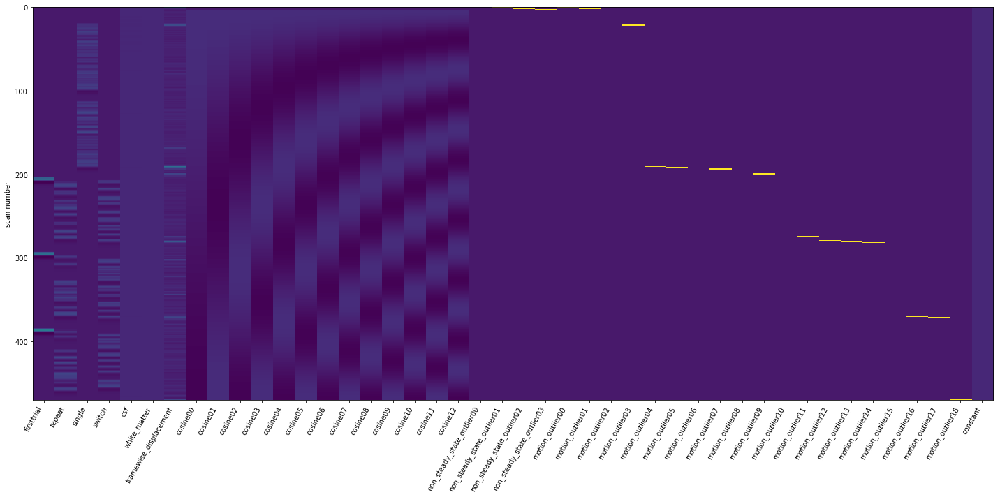

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
plot_design_matrix(design_matrix, ax=ax)

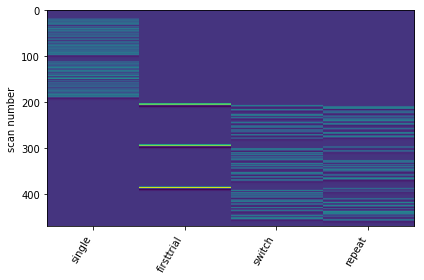

In [15]:
plot_design_matrix(design_matrix[["single", "firsttrial", "switch", "repeat"]])

In [16]:
# create and fit the model
model = FirstLevelModel(t_r=tr,
                        drift_model=None,
                        mask_img=mask_file)

model.fit(preproc_file, design_matrices=design_matrix)

FirstLevelModel(drift_model=None, drift_order=1, fir_delays=[0],
        high_pass=0.01, hrf_model='glover',
        mask_img='/home/jdkent/hpchome/bids/derivatives/fmriprep/sub-GE120001/ses-pre/func/sub-GE120001_ses-pre_task-taskswitch_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz',
        memory=Memory(cachedir=None), memory_level=1, min_onset=-24,
        minimize_memory=True, n_jobs=1, noise_model='ar1',
        signal_scaling=True, slice_time_ref=0.0, smoothing_fwhm=None,
        standardize=False, subject_label=None, t_r=2, target_affine=None,
        target_shape=None, verbose=0)

In [16]:
bg_img = layout.get(subject=participant,
                    suffix='boldref',
                    extension='nii.gz',
                    space='MNI152NLin2009cAsym',
                    task=task,
                    return_type='file')[0]

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/plotting/displays.py:600: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  if isinstance(axes, collections.Sequence):


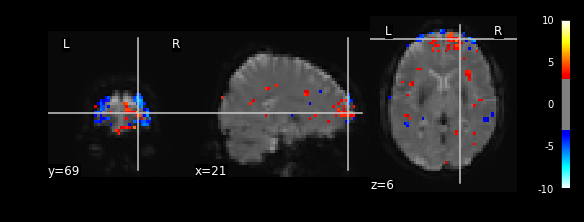

In [18]:
# local cost of switch - repeat contrast
z_map_local_cost = model.compute_contrast("switch - repeat", output_type='z_score')
plotting.plot_stat_map(z_map_local_cost, threshold=3.1, vmax=10, bg_img=bg_img)

In [19]:
html_view = plotting.view_img(z_map_local_cost, threshold=3.1, vmax=10, bg_img=bg_img)
html_view

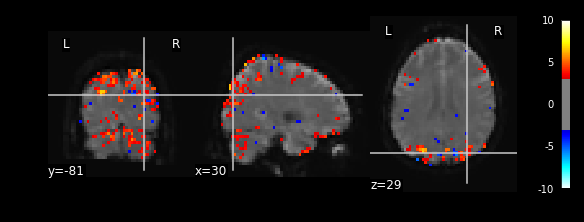

In [20]:
z_map_global_cost = model.compute_contrast("repeat - single", output_type='z_score')
plotting.plot_stat_map(z_map_global_cost, threshold=3.1, vmax=10, bg_img=bg_img)

In [21]:
html_view = plotting.view_img(z_map_global_cost, threshold=3.1, vmax=10, bg_img=bg_img)
html_view

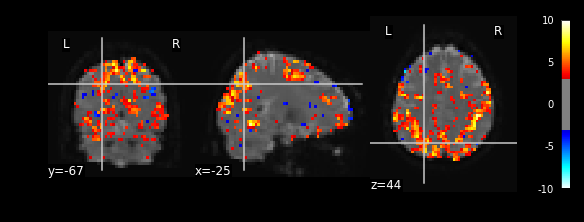

In [22]:
z_map_switch = model.compute_contrast("switch", output_type='z_score')
plotting.plot_stat_map(z_map_switch, threshold=3.1, vmax=10, bg_img=bg_img)

In [23]:
html_view = plotting.view_img(z_map_switch, threshold=3.1, vmax=10, bg_img=bg_img)
html_view

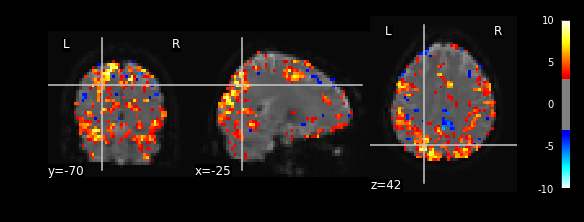

In [24]:
z_map_repeat = model.compute_contrast("repeat", output_type='z_score')
plotting.plot_stat_map(z_map_repeat, threshold=3.1, vmax=10, bg_img=bg_img)

In [25]:
html_view = plotting.view_img(z_map_repeat, threshold=3.1, vmax=10, bg_img=bg_img)
html_view

In [26]:
single = np.array([1 if c == 'single' else 0 for c in design_matrix.columns])
repeat = np.array([1 if c == 'repeat' else 0 for c in design_matrix.columns])
switch = np.array([1 if c == 'switch' else 0 for c in design_matrix.columns])
firsttrial = np.array([1 if c == 'firsttrial' else 0 for c in design_matrix.columns])

effect_of_interest = np.vstack([single, repeat, switch, firsttrial])
effect_of_interest

array([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

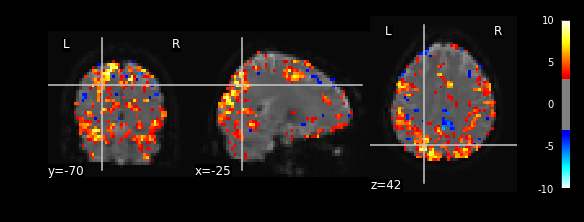

In [27]:
z_map_all = model.compute_contrast(effect_of_interest,stat_type="F", output_type='z_score')
plotting.plot_stat_map(z_map_repeat, threshold=3.1, vmax=10, bg_img=bg_img)

In [28]:
html_view = plotting.view_img(z_map_all, threshold=3.1, vmax=10, bg_img=bg_img)
html_view

In [29]:
def _check_activation(layout, participant, task, confounds, onset_offset=0):
    preproc = layout.get(subject=participant,
                     suffix='bold',
                     extension='nii.gz',
                     desc='preproc',
                     space='MNI152NLin2009cAsym',
                     task=task)[0]
    preproc_file = preproc.path
    tr = preproc.get_metadata()['RepetitionTime']
    
    
    mask_file = layout.get(subject=participant,
                       suffix='mask',
                       extension='nii.gz',
                       desc='brain',
                       space='MNI152NLin2009cAsym',
                       task=task,
                       return_type='file')[0]

    confounds_file = layout.get(subject=participant,
                            suffix='regressors',
                            extension='tsv',
                            desc='confounds',
                            task=task,
                            return_type='file')[0]
    
    event_file = layout.get(subject=participant,
                            suffix='events',
                            extension='tsv',
                            task=task,
                            return_type='file')[0]
    
    bg_img = layout.get(subject=participant,
                    suffix='boldref',
                    extension='nii.gz',
                    space='MNI152NLin2009cAsym',
                    task=task,
                    return_type='file')[0]
    
    events_df = pd.read_csv(event_file, sep='\t')
    # test events_df
    events_df['onset'] -= onset_offset
    confounds_df = _select_confounds(confounds_file, confounds)
    frame_times = np.arange(nib.load(preproc_file).shape[-1]) * tr
    # drift_model is None because I'm assuming user is passing Cosine inputs
    design_matrix = dm.make_first_level_design_matrix(
        frame_times, events_df, drift_model=None, add_regs=confounds_df,
        add_reg_names=confounds_df.columns.to_list())
    
    # plot the full design matrix
    full_des_fig, full_des_ax = plt.subplots(1, 1, figsize=(20, 10))
    plot_design_matrix(design_matrix, ax=full_des_ax)
    
    # plot just the events
    trial_types = events_df['trial_type'].unique()
    trial_des_ax = plot_design_matrix(design_matrix[trial_types])
    
    # fit the model
    model = FirstLevelModel(t_r=tr,
                            drift_model=None,
                            high_pass=None,
                            smoothing_fwhm=6.0,
                            mask_img=mask_file)

    model.fit(preproc_file, design_matrices=design_matrix)
    
    # generate overall task contrast
    effect_of_interest = np.array([[1 if c == trial_type else 0 for c in design_matrix.columns]
                                   for trial_type in trial_types])
    
    
    z_map_all = model.compute_contrast(effect_of_interest,stat_type="F", output_type='z_score')
    
    html_view = plotting.view_img(z_map_all, threshold=3.1, vmax=10, bg_img=bg_img)
    
    return full_des_ax, trial_des_ax, html_view
    


## Test different trial timing offsets

### No Offset

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


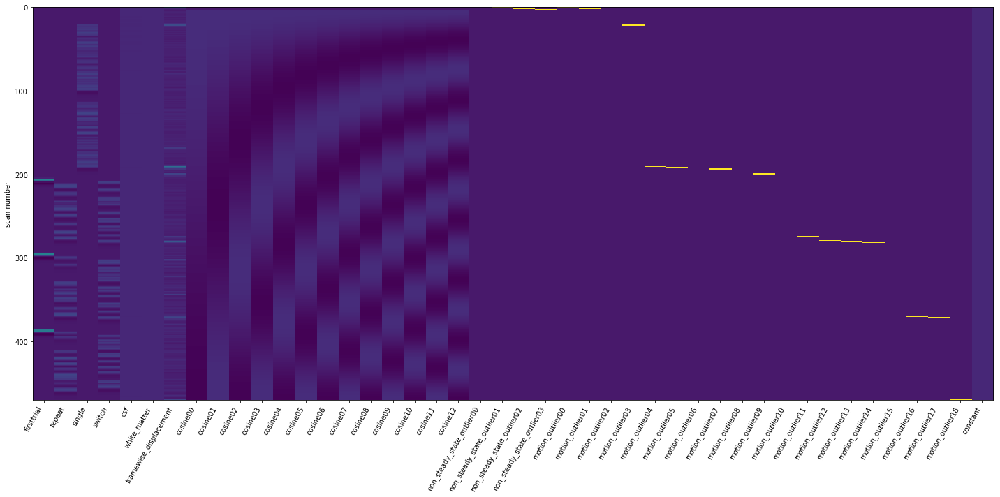

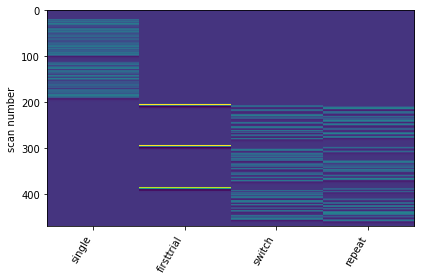

In [30]:
confounds = min_confounds
f, t, h = _check_activation(layout, 'GE120001', 'taskswitch', confounds, onset_offset=0)

In [31]:
h

### 2 second offset

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


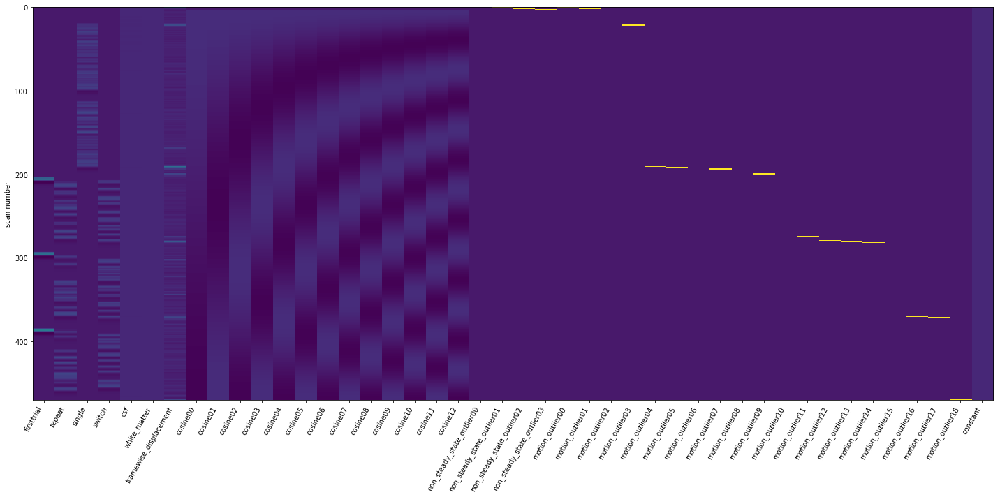

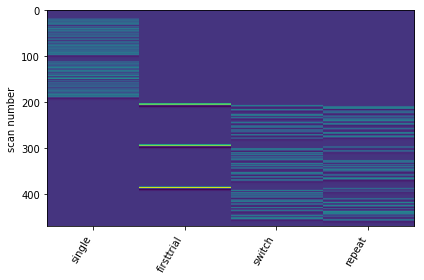

In [32]:
f2, t2, h2 = _check_activation(layout, 'GE120001', 'taskswitch', confounds, onset_offset=2)

In [33]:
h2

### 4 second offset

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


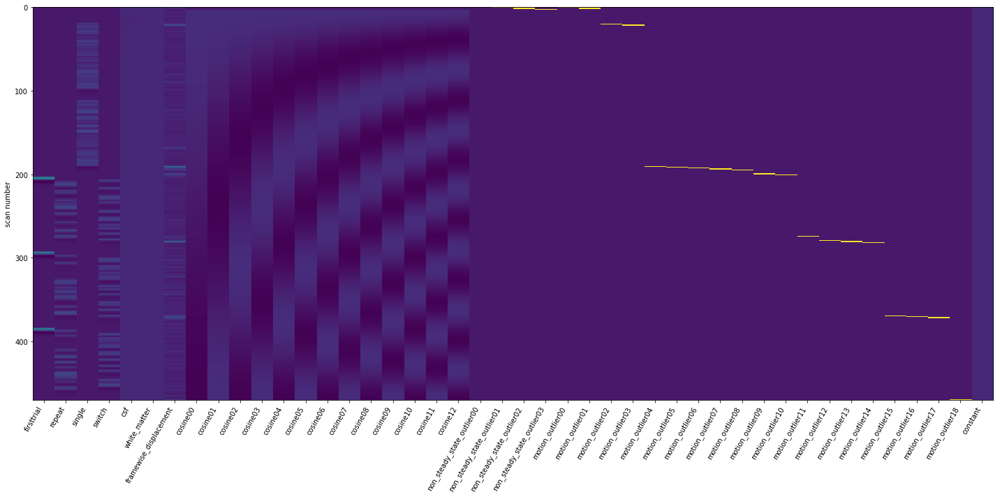

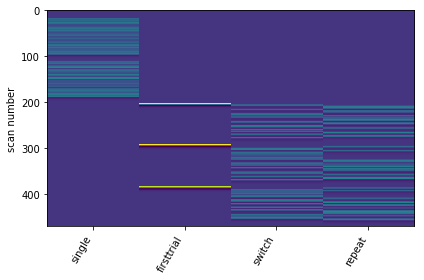

In [34]:
f3, t3, h3 = _check_activation(layout, 'GE120001', 'taskswitch', confounds, onset_offset=4)

In [35]:
h3

## Evaluate Contrast Noise Ratio for all participants

In [45]:
from beta_sim.interfaces.fmrisim import ContrastNoiseRatio

200325-22:49:43,276 nipype.utils INFO:
	 No new version available.


In [46]:
cnr_test = ContrastNoiseRatio(events_files=[event_file],
                              bold_file=preproc_file,
                              method="Welvaert",
                              confounds_file=confounds_file,
                              selected_confounds=["white_matter", "csf", "framewise_displacement", "non_steady_state_outlier[0-9]{2}", "motion_outlier[0-9]{2}"],
                              tr=tr)

In [47]:
cnr_res = cnr_test.run()

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/wrapper.py:100: DeprecationWarning: `formatargspec` is deprecated since Python 3.5. Use `signature` and the `Signature` object directly
  defaults=argspec[3])
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero 

________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc32850>, verbose=0)


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nilearn/_utils/niimg.py:150: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  if isinstance(niimgs, collections.Iterable):
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc8b7c9890>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc32850>, <nibabel.nifti1.Nifti1Image object at 0x7efc8b7c9890>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 3.497722, ..., -2.764653]), <nibabel.nifti1.Nifti1Image object at 0x7efc8b7c9890>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([  9.640338, ..., -13.103764]), <nibabel.nifti1.Nifti1Image object at 0x7efc8b7c9890>)
___________________________________________________________unmask - 0.0s, 0.0min


In [48]:
cnr_res.outputs.cnr

4.617389764603134

In [49]:
cnr_res.outputs.noise_std

300.00584160228476

## Calculate CNR for all participants

In [50]:
from multiprocessing.pool import Pool
N_THREADS=20

In [51]:
def _calc_cnr(tr, events_file, bold_file, confounds_file, selected_confounds):
    cnr_test = ContrastNoiseRatio(events_files=[events_file],
                              bold_file=bold_file,
                              method="Welvaert",
                              confounds_file=confounds_file,
                              selected_confounds=selected_confounds,
                              tr=tr)
    cnr_res = cnr_test.run()
    
    return cnr_res.outputs.cnr, cnr_res.outputs.noise_std

In [52]:
mah_confounds = ["white_matter", "csf", "framewise_displacement", "non_steady_state_outlier[0-9]{3}", "motion_outlier[0-9]{2}"]

In [53]:
def _get_bold_file(layout, participant):
    return layout.get(
            subject=participant,
            suffix='bold',
            extension='nii.gz',
            desc='preproc',
            space='MNI152NLin2009cAsym',
            task='taskswitch',
            return_type='file')[0]

def _get_event_file(layout, participant):
    return layout.get(subject=participant,
                            suffix='events',
                            extension='tsv',
                            task='taskswitch',
                            return_type='file')[0]

def _get_confounds_file(layout, participant):
      return layout.get(subject=participant,
                            suffix='regressors',
                            extension='tsv',
                            desc='confounds',
                            task=task,
                            return_type='file')[0]


In [54]:
init_sub = "GE120001"
p = init_sub
iter_tup = (2, _get_event_file(layout, p), _get_bold_file(layout, p), _get_confounds_file(layout, p), mah_confounds)

In [55]:
iter_tup

(2,
 '/home/jdkent/hpchome/bids/sub-GE120001/ses-pre/func/sub-GE120001_ses-pre_task-taskswitch_events.tsv',
 '/home/jdkent/hpchome/bids/derivatives/fmriprep/sub-GE120001/ses-pre/func/sub-GE120001_ses-pre_task-taskswitch_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/home/jdkent/hpchome/bids/derivatives/fmriprep/sub-GE120001/ses-pre/func/sub-GE120001_ses-pre_task-taskswitch_desc-confounds_regressors.tsv',
 ['white_matter',
  'csf',
  'framewise_displacement',
  'non_steady_state_outlier[0-9]{3}',
  'motion_outlier[0-9]{2}'])

In [56]:
iter_list = [
  (2,
  f'/home/jdkent/hpchome/bids/sub-{sub}/ses-pre/func/sub-{sub}_ses-pre_task-taskswitch_events.tsv',
  f'/home/jdkent/hpchome/bids/derivatives/fmriprep/sub-{sub}/ses-pre/func/sub-{sub}_ses-pre_task-taskswitch_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
  f'/home/jdkent/hpchome/bids/derivatives/fmriprep/sub-{sub}/ses-pre/func/sub-{sub}_ses-pre_task-taskswitch_desc-confounds_regressors.tsv',
  mah_confounds) for sub in layout.get_subjects()]

In [57]:
# iter_list = [(2, _get_event_file(layout, p), _get_bold_file(layout, p), _get_confounds_file(layout, p), mah_confounds) for p in layout.get_subjects()]

In [58]:
RUN_CNR = True

if RUN_CNR:
    with Pool(N_THREADS // 4) as p:
        cnrs, noise_stds = p.starmap(_calc_cnr, iter_list)
else:
    cnrs = [8.920126123802175,
             17.21488505178445,
             4.721870188263878,
             30.981985886039634,
             4.473452600960166,
             2.7184673340383805,
             4.1843906678341085,
             5.46267836808929,
             9.767182702168668,
             8.534803398562765,
             7.9962192402318575,
             5.5367232211920125,
             13.539611537106763,
             6.126523564742624,
             6.681287032341141,
             7.172273456473401,
             3.591860986401371,
             8.478190285861364,
             40.887789675840786,
             7.025582327092387,
             9.286306277842465,
             5.463741762910528,
             9.003549984727888,
             4.067032262886038,
             7.229743046338781,
             6.470212927434842,
             6.122825079826058,
             201.70771984341755,
             4.590664058164403,
             9.438656868913657,
             7.2294864186576095,
             4.769838613639502,
             4.904718565892622,
             4.983979660188473,
             11.001161657409046,
             5.0014344311419405,
             6.214440848697583,
             9.67931267243326,
             6.5323708047145885,
             3.314231060358519,
             2.535981444047886,
             2.762217148272336,
             4.9028876277504105,
             5.13656661477089,
             6.794729109907558,
             3.1176278787072897,
             10.010016924891344,
             19.07904938561454,
             10.228766752057187,
             5.724579668297202,
             6.629922257112938,
             4.399816014546433,
             6.674315551089845,
             9.802262695008062,
             7.3439895037075535,
             8.771714943377011,
             4.682257726775947,
             4.262581197453722,
             4.452418463645356,
             6.968175239504877,
             7.399922267458388]
cnrs

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. C

________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972aad0>, verbose=0)
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972afd0>, verbose=0)
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972a710>, verbose=0)
_________________________________________________compute_epi_mask - 3.3s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>, target_affine=None, target_shape=None, copy=False, interpolat

       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
_______________________________________________________run_glm - 607.1s, 10.1min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.610032, ..., -0.656617]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-6.191292, ..., -2.354759]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


_______________________________________________________run_glm - 806.6s, 13.4min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 3.326696, ..., -3.446827]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([  9.03047 , ..., -17.084581]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.2s, 0.0min
_______________________________________________________run_glm - 860.9s, 14.3min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.716024, ..., -0.082962]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-6.6408  , ..., -1.523911]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54c50>)
___________________________________________________________unmask - 0.2s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


_______________________________________________________run_glm - 869.5s, 14.5min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.065546, ..., -0.802659]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54e90>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -9.52532 , ..., -10.545082]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54e90>)
___________________________________________________________unmask - 0.1s, 0.0min
_______________________________________________________run_glm - 873.7s, 14.6min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.610004, ..., -1.587265]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54e90>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-5.052826, ..., -9.376503]), <nibabel.nifti1.Nifti1Image object at 0x7efc9fb54e90>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca970ec50>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.992072, ..., -1.031911]), <nibabel.nifti1.Nifti1Image object at 0x7efc94474210>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 2.1991  , ..., -2.810434]), <nibabel.nifti1.Nifti1Image object at 0x7efc94474210>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc127d0>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca970edd0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc127d0>, <nibabel.nifti1.Nifti1Image object at 0x7efca970edd0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.431934, ...,  0.464668]), <nibabel.nifti1.Nifti1Image object at 0x7efca970edd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.228514, ...,  1.623546]), <nibabel.nifti1.Nifti1Image object at 0x7efca970edd0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc8373f1d0>, verbose=0)
_________________________________________________compute_epi_mask - 7.2s, 0.1min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.645129, ..., 0.529032]), <nibabel.nifti1.Nifti1Image object at 0x7efca1b63e50>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([10.87407, ...,  2.50458]), <nibabel.nifti1.Nifti1Image object at 0x7efca1b63e50>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________run_glm - 101.1s, 1.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.508486, ..., -0.295829]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc02ed0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([17.631205, ..., -1.361513]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc02ed0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 173.8s, 2.9min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.433932, ..., -3.185175]), <nibabel.nifti1.Nifti1Image object at 0x7efc944741d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-10.024386, ..., -39.419676]), <nibabel.nifti1.Nifti1Image object at 0x7efc944741d0>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdk

________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc03d50>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca970ebd0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc03d50>, <nibabel.nifti1.Nifti1Image object at 0x7efca970ebd0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.392487, ..., -0.968382]), <nibabel.nifti1.Nifti1Image object at 0x7efca970ebd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-3.267596, ..., -4.767464]), <nibabel.nifti1.Nifti1Image object at 0x7efca970ebd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc12a10>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.79433 , ..., -0.120841]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446ffd0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 2.618772, ..., -0.541603]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446ffd0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 155.0s, 2.6min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.027225, ...,  0.858773]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2450>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-14.021334, ...,   6.175551]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2450>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972af50>, verbose=0)
_________________________________________________compute_epi_mask - 5.4s, 0.1min
________________________________________________________________________________
[Memory] Call

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


__________________________________________________filter_and_mask - 9.8s, 0.2min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ 978., ..., 1042.],
       ...,
       [ 684., ...,  780.]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
_________________________________________________________run_glm - 94.6s, 1.6min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.598232, ..., -2.425915]), <nibabel.nifti1.Nifti1Image object at 0x7efca28a2e10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.746243, ..., -7.09369 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca28a2e10>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________run_glm - 192.2s, 3.2min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.521407, ...,  1.969346]), <nibabel.nifti1.Nifti1Image object at 0x7efca19e4410>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-7.070507, ..., 11.43524 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca19e4410>)
___________________________________________________________unmask - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6ceb690>, verbose=0)
_________________________________________________compute_epi_mask - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efcae089810>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6ceb690>, <nibabel.nifti1.Nifti1Image object at 0x7efcae089810>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.061268, ..., -2.389023]), <nibabel.nifti1.Nifti1Image object at 0x7efcae089810>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.195813, ..., -5.378391]), <nibabel.nifti1.Nifti1Image object at 0x7efcae089810>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd41a10>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca288df10>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd41a10>, <nibabel.nifti1.Nifti1Image object at 0x7efca288df10>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.738276, ..., 1.424437]), <nibabel.nifti1.Nifti1Image object at 0x7efca288df10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.905066, ..., 6.125332]), <nibabel.nifti1.Nifti1Image object at 0x7efca288df10>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cfa950>, verbose=0)
_________________________________________________compute_epi_mask - 2.7s, 0.0min
________________________________________________________________________________
[Memory] Calling ni

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd472d0>, verbose=0)
_________________________________________________compute_epi_mask - 7.1s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca9702f90>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd472d0>, <nibabel.nifti1.Nifti1Image object at 0x7efca9702f90>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.026153, ..., -0.162286]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd3b290>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-37.590224, ...,  -3.687284]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd3b290>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 194.1s, 3.2min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.160542, ..., 0.280188]), <nibabel.nifti1.Nifti1Image object at 0x7efca9702f90>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.113811, ..., 1.306936]), <nibabel.nifti1.Nifti1Image object at 0x7efca9702f90>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________run_glm - 178.8s, 3.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.665751, ..., -1.594482]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6b94bd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 9.095717, ..., -7.975265]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6b94bd0>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca970ea50>, verbose=0)
_________________________________________________compute_epi_mask - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca970cf10>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca970ea50>, <nibabel.nifti1.Nifti1Image object at 0x7efca970cf10>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.536183, ..., 2.119946]), <nibabel.nifti1.Nifti1Image object at 0x7efca970cf10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([2.594016, ..., 5.466314]), <nibabel.nifti1.Nifti1Image object at 0x7efca970cf10>)
___________________________________________________________unmask - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcc75025d0>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efcadd417d0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcc75025d0>, <nibabel.nifti1.Nifti1Image object at 0x7efcadd417d0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.14242 , ...,  1.931171]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd417d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.710195, ...,  9.503967]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd417d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca28929d0>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.128487, ..., -2.403436]), <nibabel.nifti1.Nifti1Image object at 0x7efca9729050>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -8.532166, ..., -14.309758]), <nibabel.nifti1.Nifti1Image object at 0x7efca9729050>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972be50>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd41190>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)


________________________________________________________run_glm - 100.6s, 1.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([3.072107, ..., 0.726584]), <nibabel.nifti1.Nifti1Image object at 0x7efcc7502450>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([9.456705, ..., 5.544979]), <nibabel.nifti1.Nifti1Image object at 0x7efcc7502450>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 139.9s, 2.3min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.325187, ..., -0.034574]), <nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 2.420245, ..., -0.2611  ]), <nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca972bbd0>, verbose=0)
_________________________________________________compute_epi_mask - 1.9s, 0.0min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


_________________________________________________________run_glm - 65.2s, 1.1min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.153146, ..., -1.136654]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd41510>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 5.518808, ..., -4.363082]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd41510>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd47690>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc25fd0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd47690>, <nibabel.nifti1.Nifti1Image object at 0x7efc9cc25fd0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.834416, ..., -0.159809]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc25fd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 4.335   , ..., -0.686651]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc25fd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cd4450>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Callin

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cd4450>, <nibabel.nifti1.Nifti1Image object at 0x7efc9d4ec250>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmp9d2wmh6f/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
__________________________________________________filter_and_mask - 2.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ 884., ..., 1111.],
       ...,
       [ 599., ...,  529.]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.168538, ..., 5.420125]), <nibabel.nifti1.Nifti1Image object at 0x7efc9d4ec250>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 2.699058, ..., 36.703204]), <nibabel.nifti1.Nifti1Image object at 0x7efc9d4ec250>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cbff110>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling 

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________run_glm - 200.9s, 3.3min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([2.84638 , ..., 2.624812]), <nibabel.nifti1.Nifti1Image object at 0x7efca28922d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([13.88177 , ..., 18.499945]), <nibabel.nifti1.Nifti1Image object at 0x7efca28922d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.208555, ...,  0.565142]), <nibabel.nifti1.Nifti1Image object at 0x7efca972b550>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Cal

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.031414, ..., -1.589004]), <nibabel.nifti1.Nifti1Image object at 0x7efc8496cc90>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.33732 , ..., -8.766639]), <nibabel.nifti1.Nifti1Image object at 0x7efc8496cc90>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd64e90>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc9446fc10>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd64e90>, <nibabel.nifti1.Nifti1Image object at 0x7efc9446fc10>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.455609, ..., -0.75566 ]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446fc10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-4.261502, ..., -4.503726]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446fc10>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2050>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc39d90>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2050>, <nibabel.nifti1.Nifti1Image object at 0x7efc9cc39d90>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.379315, ..., -0.922537]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc39d90>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-8.89545 , ..., -2.498359]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc39d90>)
___________________________________________________________unmask - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca9725110>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efcae0891d0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cce150>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.095902, ...,  1.149882]), <nibabel.nifti1.Nifti1Image object at 0x7efca97295d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________run_glm - 220.8s, 3.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-10.298085, ...,  11.115096]), <nibabel.nifti1.Nifti1Image object at 0x7efca97295d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-3.20596 , ...,  0.350644]), <nibabel.nifti1.Nifti1Image object at 0x7efcae0891d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-62.502467, ...,   3.303782]), <nibabel.nifti1.Nifti1Image object at 0x7efcae0891d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 146.2s, 2.4min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.407731, ...,  1.688448]), <nibabel.nifti1.Nifti1Image object at 0x7efca972be50>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.547928, ..., 14.706663]), <nibabel.nifti1.Nifti1Image object at 0x7efca972be50>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9d408e10>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc94465410>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/utils.py:292: UserWarning: Matrix is singular at working precision, regularizing...
  warn('Matrix is singular at working precision, regularizing...')


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9d408e10>, <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmp7gxgb_ct/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
__________________________________________________filter_and_mask - 1.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[1561., ..., 1674.],
       ...,
       [ 956., ..., 1128.]], dtype=float32), 
array([[ 2.847028e-13, ...,  1.000000e+00],
       ...,
       

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.721768, ..., -0.773076]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-270.830712, ..., -282.575603]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cd4f10>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Ca

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cd4f10>, <nibabel.nifti1.Nifti1Image object at 0x7efc9446f550>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmpzbtf3450/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
__________________________________________________filter_and_mask - 2.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[800., ..., 793.],
       ...,
       [575., ..., 563.]], dtype=float32), array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_mode

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.504217, ...,  1.128698]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446f550>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.336635, ...,  2.313255]), <nibabel.nifti1.Nifti1Image object at 0x7efc9446f550>)
___________________________________________________________unmask - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cfa1d0>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cfae10>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca9725950>, verbose=0)
_________________________________________________compute_epi_mask - 1.6s, 0.0min
________________________________________

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9d408110>, verbose=0)
_________________________________________________compute_epi_mask - 6.7s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efc8373f050>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.897257, ...,  0.491055]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.0s, 0.0min
___________________________________

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9d408110>, <nibabel.nifti1.Nifti1Image object at 0x7efc8373f050>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmp1ihdr1n8/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.924566, ..., -0.626836]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.0s, 0.0min
______________________________________________________________________

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.541675, ..., 1.153758]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6cfae10>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([3.804847, ..., 7.933456]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6cfae10>)
___________________________________________________________unmask - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


_________________________________________________________run_glm - 99.3s, 1.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.584351, ..., 0.585729]), <nibabel.nifti1.Nifti1Image object at 0x7efc8373f050>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([4.218359, ..., 1.89527 ]), <nibabel.nifti1.Nifti1Image object at 0x7efc8373f050>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc29b10>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling ni

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


_________________________________________________________run_glm - 35.1s, 0.6min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.54028 , ..., -0.240893]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6eb8a10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.209148, ..., -0.670377]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6eb8a10>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc00250>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca972b050>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc00250>, <nibabel.nifti1.Nifti1Image object at 0x7efca972b050>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc088d0>, <nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmpq4jifjpu/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
_________________________________________________filter_and_mask - 15.5s, 0.3min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[1075., ..., 1162.],
       ...,
       [ 660., ...,  744.]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


_________________________________________________filter_and_mask - 13.9s, 0.2min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[1500., ..., 1155.],
       ...,
       [ 960., ...,  892.]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
________________________________________________________run_glm - 208.3s, 3.5min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.822673, ..., -0.087252]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6cdb410>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 4.902625, ..., -0.563405]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6cdb410>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 219.6s, 3.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.013338, ...,  1.36756 ]), <nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.042437, ...,  7.940192]), <nibabel.nifti1.Nifti1Image object at 0x7efcc75023d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________run_glm - 363.5s, 6.1min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.078604, ...,  0.748773]), <nibabel.nifti1.Nifti1Image object at 0x7efca9725e10>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-10.748801, ...,   8.208587]), <nibabel.nifti1.Nifti1Image object at 0x7efca9725e10>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 179.3s, 3.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.647991, ...,  1.076949]), <nibabel.nifti1.Nifti1Image object at 0x7efca28a24d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-6.120379, ...,  3.123424]), <nibabel.nifti1.Nifti1Image object at 0x7efca28a24d0>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc0b190>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca970c890>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efc9cc0b190>, <nibabel.nifti1.Nifti1Image object at 0x7efca970c890>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'lo

       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
________________________________________________________run_glm - 343.9s, 5.7min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.424665, ..., 3.454781]), <nibabel.nifti1.Nifti1Image object at 0x7efca970c890>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 4.985042, ..., 16.45636 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca970c890>)
___________________________________________________________unmask - 0.2s, 0.0min
_______________________________________________________run_glm - 690.1s, 11.5min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.017738, ..., -1.43532 ]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2750>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-3.237955, ..., -7.157395]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6ce2750>)
___________________________________________________________unmask - 0.2s, 0.0min
_______________________________________________________run_glm - 597.8s, 10.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([2.224245, ..., 0.872542]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([9.267766, ..., 2.176599]), <nibabel.nifti1.Nifti1Image object at 0x7efc94465410>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


_______________________________________________________run_glm - 720.6s, 12.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.834738, ..., -1.948422]), <nibabel.nifti1.Nifti1Image object at 0x7efca3a80210>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -7.780661, ..., -15.178341]), <nibabel.nifti1.Nifti1Image object at 0x7efca3a80210>)
___________________________________________________________unmask - 0.0s, 0.0min
_______________________________________________________run_glm - 738.1s, 12.3min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.585136, ..., -1.796758]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd472d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -7.198965, ..., -14.39818 ]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd472d0>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcb6cf8290>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Call

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([2.771432, ..., 0.393914]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd6b890>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([10.702415, ...,  1.158976]), <nibabel.nifti1.Nifti1Image object at 0x7efcadd6b890>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efcadd6b350>, verbose=0)
_________________________________________________compute_epi_mask - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling 

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-3.040937, ..., -1.484157]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6b948d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-8.359837, ..., -3.190821]), <nibabel.nifti1.Nifti1Image object at 0x7efcb6b948d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________run_glm - 554.4s, 9.2min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-2.015453, ...,  0.367785]), <nibabel.nifti1.Nifti1Image object at 0x7efcbc2ca9d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-15.32303 , ...,   2.808166]), <nibabel.nifti1.Nifti1Image object at 0x7efcbc2ca9d0>)
___________________________________________________________unmask - 0.1s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:606: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:607: RuntimeWarning: invalid value encountered in true_divide
  (1+np.exp(-params))).copy()


_______________________________________________________run_glm - 611.3s, 10.2min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________run_glm - 575.7s, 9.6min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.341195, ..., -0.424094]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc21250>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 2.241426, ..., -6.888975]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc21250>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-3.072343, ..., -0.73963 ]), <nibabel.nifti1.Nifti1Image object at 0x7efc9cc22ad0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] C

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)


________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca0573d90>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7efca05738d0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:649: RuntimeWarning: divide by zero encountered in true_divide
  R_mat, T_mat)
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca0573d90>, <nibabel.nifti1.Nifti1Image object at 0x7efca05738d0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': None,
  'standardize': False,
  't_r': 2.0,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='/tmp/tmpttt7vyw5/joblib'), verbose=0, confounds=None, copy=True, dtype=None)
__________________________________________________filter_and_mask - 2.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[1945., ..., 1337.],
       ...,
       [1205., ...,  786.]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.248619, ..., -1.40455 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca05738d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -1.507937, ..., -14.755979]), <nibabel.nifti1.Nifti1Image object at 0x7efca05738d0>)
___________________________________________________________unmask - 0.1s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.compute_epi_mask...
compute_epi_mask(<nibabel.nifti1.Nifti1Image object at 0x7efca970cdd0>, verbose=0)
_________________________________________________compute_epi_mask - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Call

/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.599728, ...,  0.406685]), <nibabel.nifti1.Nifti1Image object at 0x7efcbc2caa90>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.330884, ...,  1.966903]), <nibabel.nifti1.Nifti1Image object at 0x7efcbc2caa90>)
___________________________________________________________unmask - 0.1s, 0.0min
_________________________________________________________run_glm - 60.3s, 1.0min


/home/jdkent/.conda/envs/aim1_valid/lib/python3.7/site-packages/nistats/regression.py:330: FutureWarning: 'wresid' from RegressionResults has been deprecated and will be removed. Please use 'whitened_residuals' instead.
  FutureWarning,


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.369253, ..., -2.06223 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca2892250>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ -2.619385, ..., -14.88304 ]), <nibabel.nifti1.Nifti1Image object at 0x7efca2892250>)
___________________________________________________________unmask - 0.1s, 0.0min


ValueError: too many values to unpack (expected 2)

In [ ]:
# select the percentiles for simulating different cnrs
np.percentile(cnrs, (10, 50, 90))

In [ ]:
cnrs